## Readme
This file provides 
- the documentation of ComputableVis 
- the examples in the application scenario and use cases

In [1]:
import vOperator
from vOperator import Chart

import utils.helper as uhelper

In [99]:
import pandas as pd
import os 
import glob
import networkx
import itertools
import copy
import matplotlib.pyplot as plt
import numpy as np

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
def Vega(spec):
    bundle = {}
    bundle['application/vnd.vega.v5+json'] = spec
    display(bundle, raw=True)

def VegaLite(spec):
    bundle = {}
    bundle['application/vnd.vegalite.v4+json'] = spec
    display(bundle, raw=True)

### 1. Documentation
ComputableVis implements three basic operations (union, difference, and intersection) on Vega-Lite specifications. 
- It first converts Vega-Lite specifications into relational databases. 
- Then the above operations are performed on the relational representation based on relational algebra (e.g. join).

### 1.1 Prerequisite
ComputableVis describles Vega-lite specifications as a relational database including:
- df_data: corresponding to the "data" entries in Vega-Lite 
- df_style: corresponding to the remaining entries in Vega-Lite (e.g., encoding, mark etc)
- df_relation: maintain the relationships between df_data and df_style

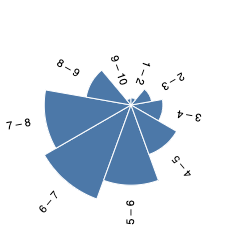

In [4]:
## load a chart
chart = Chart('examples/spec-v4/arc_radial_histogram.vl.json')
chart.show()

In [5]:
## the data database
chart.df_data.head()

,Title,US Gross,Worldwide Gross,US DVD Sales,Production Budget,Release Date,MPAA Rating,Running Time min,Distributor,Source,Major Genre,Creative Type,Director,Rotten Tomatoes Rating,IMDB Rating,IMDB Votes
0,The Land Girls,146083.0,146083.0,NaN,8000000.0,Jun 12 1998,R,NaN,Gramercy,None,None,None,None,NaN,6.1,1071.0
1,"First Love, Last Rites",10876.0,10876.0,NaN,300000.0,Aug 07 1998,R,NaN,Strand,None,Drama,None,None,NaN,6.9,207.0
2,I Married a Strange Person,203134.0,203134.0,NaN,250000.0,Aug 28 1998,None,NaN,Lionsgate,None,Comedy,None,None,NaN,6.8,865.0
3,Let's Talk About Sex,373615.0,373615.0,NaN,300000.0,Sep 11 1998,None,NaN,Fine Line,None,Comedy,None,None,13.0,NaN,NaN
4,Slam,1009819.0,1087521.0,NaN,1000000.0,Oct 09 1998,R,NaN,Trimark,Original Screenplay,Drama,Contemporary Fiction,None,62.0,3.4,165.0


In [6]:
## the style database
chart.df_style.head()

,property,value
0,$schema,https://vega.github.io/schema/vega-lite/v4.json
1,layer_0_mark_type,arc
2,layer_0_mark_stroke,white
3,layer_0_mark_tooltip,True
4,layer_1_mark_type,text


In [7]:
## the style database can be converted back to the Vega-Lite specifications
print(uhelper.df_to_vSpec(chart.df_style))

{'$schema': 'https://vega.github.io/schema/vega-lite/v4.json', 'layer': [{'mark': {'type': 'arc', 'stroke': 'white', 'tooltip': True}}, {'mark': {'type': 'text', 'radiusOffset': 15, 'align': 'right'}, 'encoding': {'text': {'bin': True, 'field': 'IMDB Rating'}, 'angle': {'bin': True, 'field': 'IMDB Rating', 'scale': {'range': [90, 450]}}}}], 'encoding': {'theta': {'bin': True, 'field': 'IMDB Rating'}, 'radius': {'aggregate': 'count', 'scale': {'type': 'sqrt'}}}, 'config': {'view': {'stroke': None}}}


In [8]:
## df_relation maintains the relationships between df_data and df_style. 
## In the following example, we see that the data_field "IMDB Rating" is linked to several properties in df_style such as "layer_1_encoding_text_field"
chart.df_relation

,data_field,data_type,property,value
0,IMDB Rating,quantitative,layer_1_encoding_text_field,IMDB Rating
1,IMDB Rating,quantitative,layer_1_encoding_angle_field,IMDB Rating
2,IMDB Rating,quantitative,encoding_theta_field,IMDB Rating


### 1.2 Union
The union operation aims to combine two visualizations. 

vOperator.union(chart1, chart2, how_data = "left_on_conflict",  how_style = "left_on_conflict", auto_encoding = False)
Parameters:
- how_data: {'left', 'right', 'left_on_conflict', 'right_on_conflict', 'concat'}. How to merge df_union
    - 'left': select the data from the left (chart1)
    - 'right': select the data from the right (chart2)
    - 'left_on_conflict': merge the data from both and select the data from the left when data conflicting
    - 'right_on_conflict': merge the data from both and select the data from the right when data conflicting
    - 'concat': concat data from both
- how_style: {'left', 'right', 'left_on_conflict', 'right_on_conflict'}. How to merge df_style
    - 'left': select the data from the left (chart1)
    - 'right': select the data from the right (chart2)
    - 'left_on_conflict': merge the data from both and select the data from the left when data conflicting
    - 'right_on_conflict': merge the data from both and select the data from the right when data conflicting
- auto_encoding: {string|Boolean}. The encoding channel on which to encode the newly added data column denoting whether the data record is from chart1 or chart2

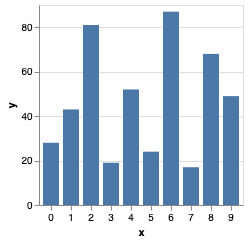

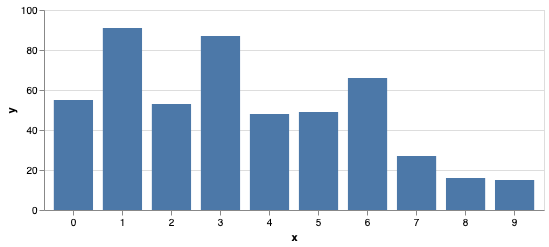

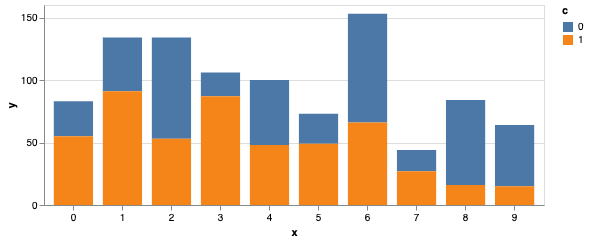

In [9]:
## union two charts with auto_encoding
c1 = Chart('examples/bar/bar0.json')
c2 = Chart('examples/bar/bar1.json')
c = vOperator.union(c1, c2, how_data = 'concat', auto_encoding = 'color')
c1.show()
c2.show()
c.show()

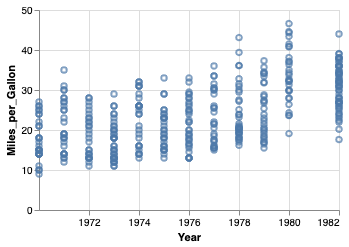

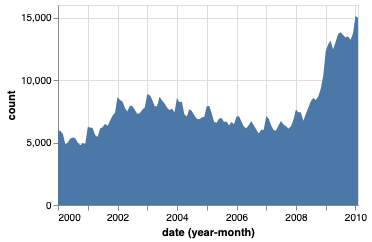

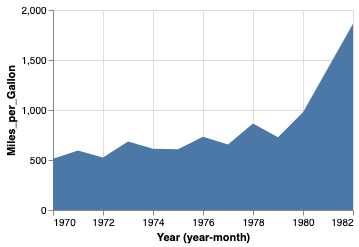

In [15]:
## union the data from c1 with the style from c2
c1 = Chart('styleTransfer/spec/1_data.json')
c2 = Chart('styleTransfer/spec/1_style.json')
c = vOperator.union(c1, c2, how_data = 'left', how_style = 'right')
c1.show()
c2.show()
c.show()

### 1.2 Intersection && Difference
The intersection and difference operation are similar.  

difference/intersection(chart1, chart2, on_data = "all", on_style = "all")  
Parameters:
- on_data/on_style: {'all', 'none', 'key'}. Indicate data columns on which to perform join.
    - 'all': all data columns. 
    - 'key': all the primary key data column
    - 'none': ignore

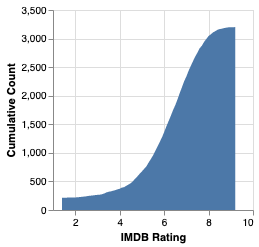

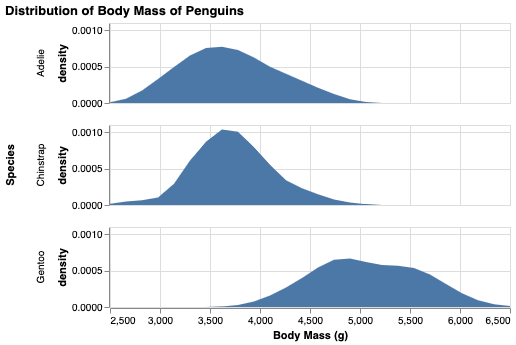

In [18]:
c1 = Chart('examples/spec-v4/area_cumulative_freq.vl.json')
c2 = Chart('examples/spec-v4/area_density_facet.vl.json')
c1.show()
c2.show()

In [27]:
## find the intersection of style. 
diff = vOperator.intersection(c1, c2, on_data = 'none', on_style = 'key')
## the results show 'property' which exists in both c1 and c2, with 'value_x' being the values in c1, and 'value_y' being the value in c2
diff['df_style']

,property,value_x,value_y,_merge
0,$schema,https://vega.github.io/schema/vega-lite/v4.json,https://vega.github.io/schema/vega-lite/v4.json,both
1,mark_type,area,area,both
2,encoding_x_field,IMDB Rating,value,both
3,encoding_x_type,quantitative,quantitative,both
4,encoding_y_field,Cumulative Count,density,both
5,encoding_y_type,quantitative,quantitative,both


In [30]:
## find the difference of style. 
diff = vOperator.difference(c1, c2, on_data = 'none', on_style = 'key')
diff['df_style']

,property,value_x,value_y,_merge
1,transform_0_sort_0_field,IMDB Rating,NaN,left_only
2,transform_0_window_0_op,count,NaN,left_only
3,transform_0_window_0_field,count,NaN,left_only
4,transform_0_window_0_as,Cumulative Count,NaN,left_only
5,transform_0_frame_0,None,NaN,left_only
6,transform_0_frame_1,0,NaN,left_only
8,encoding_x_field,IMDB Rating,value,both
10,encoding_y_field,Cumulative Count,density,both
12,title,NaN,Distribution of Body Mass of Penguins,right_only
13,width,NaN,400,right_only


### 2. Example
This part provides the source codes for the application scenarios and case studies.

### 2.1 Style Transfer

In [33]:
## the benchmark file
st_benchmark = pd.read_csv('examples/styleTransfer/style_transfer_benchmark.csv')
st_benchmark.head()

,idx,file,result,chart_type
0,0,arc_radial_histogram.vl.json,Y,arc
1,1,area.vl.json,Y,area.vl.json
2,2,area_cumulative_freq.vl.json,Y,area
3,3,area_density.vl.json,Y,area
4,4,area_density_facet.vl.json,extent,area


In [36]:
## The results
st_benchmark['result'].value_counts()

Y              264
filter          53
extent          18
geo              5
time_string      1
Name: result, dtype: int64

In [48]:
## random get one successful case
st_successful = st_benchmark[st_benchmark.result == 'Y']
index = st_successful['idx'].sample(n=1).tolist()[0]

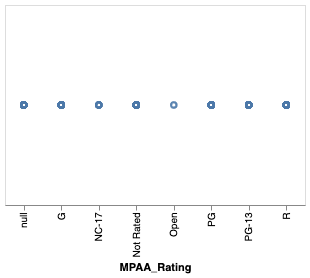

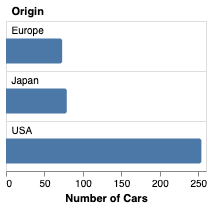

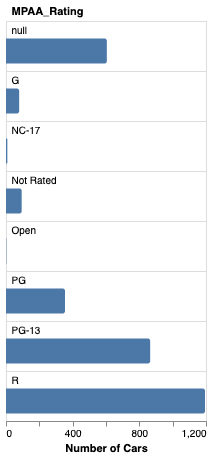

In [49]:
## read file
c_data = Chart(os.path.join('examples', 'styleTransfer', 'spec', str(index) + '_data.json'))
c_style = Chart(os.path.join('examples', 'styleTransfer', 'spec', str(index) + '_style.json'))
c = vOperator.union(c_data, c_style, how_data = 'left', how_style = 'right')
c_data.show()
c_style.show()
c.show()

### 2.2 Visualization Composition

In [75]:
## the benchmark file
comp_benchmark = pd.read_csv('examples/composite/benchmark.csv')
comp_benchmark.head()

,task,chart1,chart2,result
0,Chart-wise Juxtaposition (adjacent),vbar_colored_us_gross_mean_source,vbar_colored_worldwide_gross_mean_source,Y
1,Superposition,heatmap_colored_variable_1_variable_2_correla...,heatmap_colored_variable_1_variable_2_correla...,cannot change mark
2,Chart-wise Juxtaposition (stacked),,,Y
3,Superposition,vbar_colored_us_gross_mean_source,vbar_colored_worldwide_gross_mean_source,Y
4,Chart-wise Juxtaposition (adjacent mirror),heatmap_colored_variable_1_variable_2_correla...,heatmap_colored_variable_1_variable_2_correla...,cannot support mirror


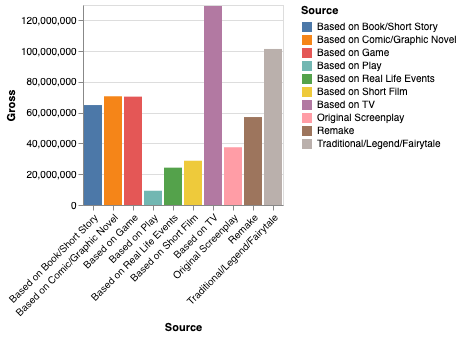

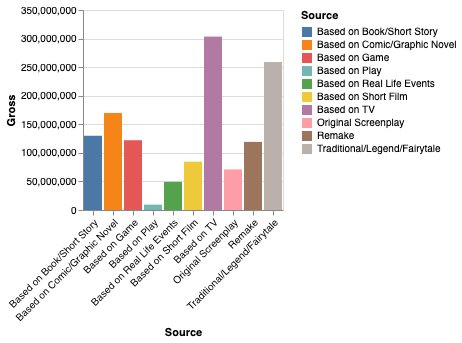

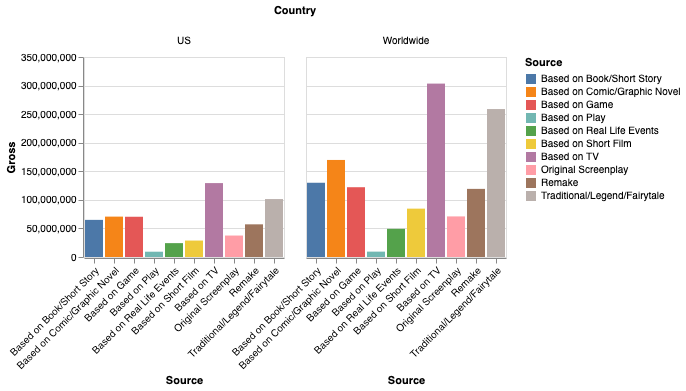

In [76]:
c1 = Chart('examples/composite/spec/vbar_colored_us_gross_mean_source.json')
c2 = Chart('examples/composite/spec/vbar_colored_worldwide_gross_mean_source.json')
c = vOperator.union(c1, c2, auto_encoding = 'column')
c1.show()
c2.show()
c.show()

## 2.3 Version Control

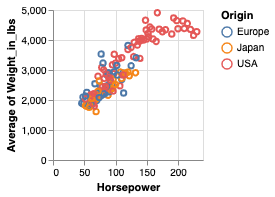

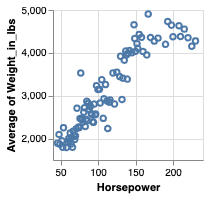

In [79]:
## diverged edits in collobrative visualization
c1 = Chart('examples/version/1.json')
c2 = Chart('examples/version/2.json')
c1.show()
c2.show()

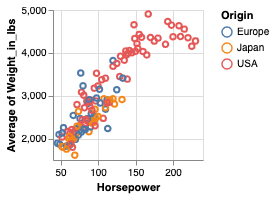

In [81]:
## Auto-merge
c = vOperator.union(c1, c2)
c.show()

### 2.4 Chart Mosaicing

In [82]:
files = glob.glob('examples/carbon/spec/*.json')
charts = [Chart(f) for f in files]

In [84]:
## Merge charts
c = charts[0]
for c2 in charts[1:]:
    c = vOperator.union(c, c2, how_data = 'concat', how_style = 'left', auto_encoding = 'column')    

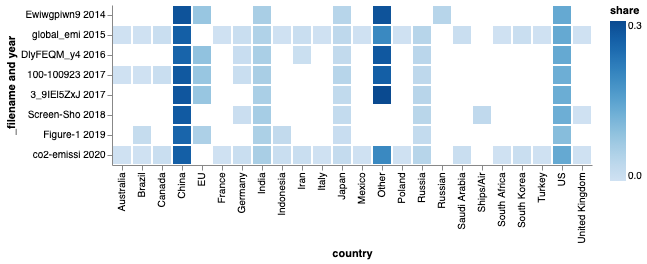

In [88]:
## Visualize the results
vSpec = copy.deepcopy(c.vSpec)
del vSpec['layer']
vSpec['encoding'] = {
    'y': {'field': '_filename and year', "sort": {"field": "year"}},
    'x': {'field': 'country', 'type': 'nominal'},
    'color': {'field': 'share', 'type': 'quantitative'},
    "tooltip": {"field": "share", "type": "quantitative"},
}
vSpec["transform"] = [
    {
      "calculate": "slice(datum._filename,0,10) + ' ' + datum.year",
      "as": "_filename and year"
    }
  ]
vSpec['mark'] = 'bar'
VegaLite(vSpec)

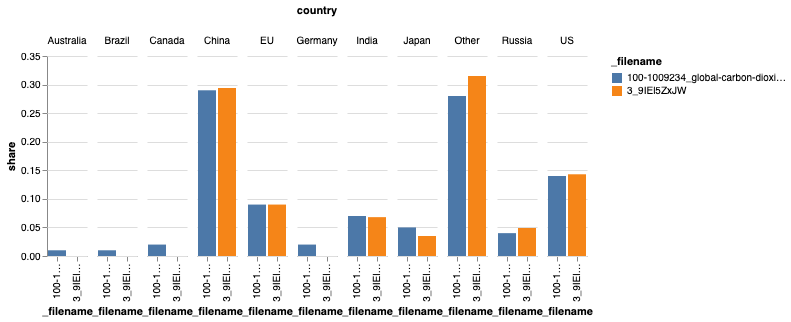

In [91]:
## From the above examples, we note two records from the year 2017
## Join them and visualize the results
c_2017 = vOperator.union(charts[4], charts[3], how_data = 'concat', how_style = 'left', auto_encoding = 'column')
vSpec = copy.deepcopy(c_2017.vSpec)
del vSpec['layer']
vSpec['encoding'] = {
    "column": {
      "field": "country", "type": "ordinal", "spacing": 10
    },
    'y': {'field': 'share', 'type': 'quantitative'},
    'x': {'field': '_filename', 'type': 'nominal', "axis": {
      "labelLimit": 40
    }},
    'color': {'field': '_filename', 'type': 'nominal'}
}
vSpec['mark'] = 'bar'
VegaLite(vSpec)

### 2.5 Chart Clustering

In [94]:
## get files in vega-v4
bdf = pd.read_csv('examples/vega_v4.csv')
bdf.head()

## keep common chart types
bdf = bdf[bdf.chart_type.isin(['point', 'bar', 'line', 'area', 'heatmap', 'boxplot', 'histogram'])]

print(bdf.chart_type.value_counts())

point        70
bar          53
line         31
area         18
heatmap      16
boxplot      12
histogram    10
Name: chart_type, dtype: int64


In [96]:
## load charts
files = []
charts = []
types = []
for idx, row in bdf.iterrows():
    f = os.path.join('examples', 'spec-v4', row['file'])
    
    c = Chart(f)
    files.append(f)
    charts.append(c)
    types.append(row['chart_type'])

print(len(files))

210


In [97]:
## customized distance between the charts
def compute_dist(left, right):
    def style_cost(row):
        if 'mark_type' in row['property'] or row['property'] == 'mark': ## we assign higher weights to 'mark_type'
            return 5
        elif 'type' in row['property']: ## we assign higher weights to 'type' (data types)
            return 1
        return 0.1
    
    df_style = vOperator.difference_property_value_df(left.df_style, right.df_style)    
    
    if df_style.empty:
        return df_style, 0
        
    df_style['cost'] = df_style.apply(lambda x: style_cost(x), axis = 1)
    style_cost = df_style['cost'].sum()
    
    return df_style, style_cost

In [100]:
## compute pairwise distance
N = len(files)
dist = np.zeros([N, N])
for i in range(0, N):
    for j in range(i + 1, N):
        c1 = charts[i]
        c2 = charts[j]

        df_style, cost = compute_dist(c1, c2) 
        
        dist[i][j] = cost
        dist[j][i] = cost

In [101]:
## use MDS to compute embeddings and project them on 2D space using TSNE
from sklearn.manifold import MDS, TSNE

mds = MDS(n_components=50, max_iter = 10000, metric = True, eps = 0.1, n_init = 10, dissimilarity="precomputed", n_jobs=1)
pos = mds.fit(dist).embedding_

pos_2d = TSNE(n_components=2).fit_transform(pos)

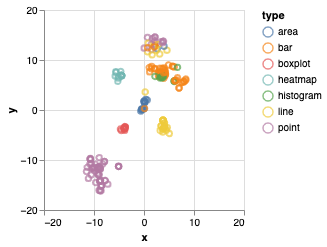

In [102]:
## visualize the results
embedding_ours = []
for idx, p in enumerate(pos_2d):
    embedding_ours.append({'x': p[0], 'y': p[1], 'f': files[idx].split('spec-v4/')[1], 'type': types[idx], 'embeddings': pos[idx].tolist()})
    
v =  { "data": {"values": embedding_ours}, "height": 200, "width": 200,
  "mark": {"type": 'point', "clip": True},
  "encoding": {
    "x": {"field": "x", "type": "quantitative", "scale": {"domain": [-16, 16]}},
    "y": {"field": "y", "type": "quantitative", "scale": {"domain": [-16, 16]}},
    "tooltip": {"field": "f", "type": "nominal"},
      "color": {"field": "type"}
  }}

VegaLite(v)

In [105]:
embedding_ours_df = pd.DataFrame.from_dict(embedding_ours)

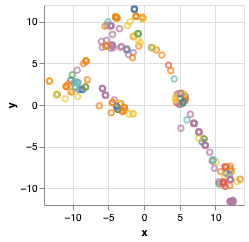

In [106]:
## compare with baseline
embeddings_baseline = []
for f in glob.glob('chartseer/embeddings/spec-v4/*.npy'):
    f_name = os.path.basename(f).split('.npy')[0]
    embeddings_baseline.append({
        'f': f_name,
        'embeddings_baseline': np.load(f)
    })
embeddings_baseline_df = pd.DataFrame.from_dict(embeddings_baseline)
embeddings_baseline_df = embeddings_baseline_df.merge(embedding_ours_df[['f', 'type']], left_on='f', right_on='f', how = 'inner')


embeddings_baseline_df['embeddings_baseline'] = pd.Series(TSNE(n_components=2).fit_transform(embeddings_baseline_df['embeddings_baseline'].tolist()).tolist())
embeddings_baseline = []
for idx, row in embeddings_baseline_df.iterrows():
    p = row['embeddings_baseline']
    
    embeddings_baseline.append({'x': p[0], 'y': p[1], 'f': row['f'], 'type': row['type'], 'embeddings': p})
    
v =  { "data": {"values": embeddings_baseline}, "height": 200, "width": 200,
  "mark": {"type": 'point', "clip": True},
  "encoding": {
    "x": {"field": "x", "type": "quantitative"},
    "y": {"field": "y", "type": "quantitative"},
    "tooltip": {"field": "f", "type": "nominal"},
      "color": {"field": "type", 'legend': False}
  }}

VegaLite(v)

### 2.6 Genetics

In [107]:
## load file
V4FILES = glob.glob('examples/spec-v4/*.json')
V4FILES.sort()
V4Files = []
V4Charts = []
for f in V4FILES:
    try:
        V4Charts.append(Chart(f))
        V4Files.append(f)
    except:
        pass

In [108]:
## compute the relationship
## we define that a chart is an ancestor if it is a subset of another

merge_nodes = [] ## save charts that are equivelant
results = []
for pair in itertools.combinations(list(range(len(V4Charts))), 2):
    idx1, idx2 = pair
    diff = vOperator.difference(V4Charts[idx1], V4Charts[idx2], on_data = 'none')
    
    d_style = diff['df_style']
    d_style = d_style[~d_style['property'].isin(['description', 'title'])] ## ignore 'description' and 'title'
    d_style = d_style[d_style['property'].apply(lambda x: not 'field' in x)] ## ignore 'type' since the data might change. We are only interested in the visual design
    
    N = d_style.shape[0]
    
    if N == 0:
        merge_nodes.append([idx1, idx2])
    else:
        count = d_style['_merge'].value_counts()

        if count['left_only'] == N:
            results.append([idx1, idx2])
        elif count['right_only'] == N:
            results.append([idx2, idx1])

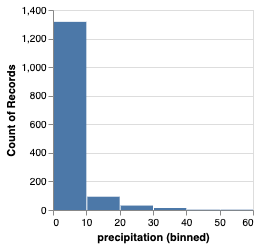

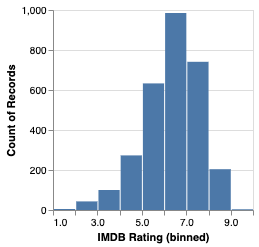

In [109]:
## inspect the merge_nodes. Each pair is considered to be the same, althrough they might encode different data
mn_1, mn_2 = merge_nodes[0]
V4Charts[mn_1].show()
V4Charts[mn_2].show()

In [110]:
## construct the network
graph = networkx.DiGraph() ## initialize a graph object
for p in results:
    graph.add_edge(p[0],p[1])

for p in merge_nodes: ## merge the same charts
    try:
        networkx.contracted_nodes(graph, p[0],p[1],  copy = False) 
    except:
        pass

In [112]:
## color theme by mark_type
alltypes = ['boxplot', 'bar', 'tick', 'circle', 'rect', 'point', 'area', 'mixed', 'line']
colors = [
      "#5079a5",
      "#ef8e3b",
      "#dd565c",
      "#79b7b2",
      "#5da052",
      "#ecc853",
      "#ad7aa1",
      "#ef9ba7",
      "#9b7461",
      "#bab0ac"]
        
type_2_color = {}
for idx, mark_type in enumerate(alltypes):
    type_2_color[mark_type] = colors[idx]

def get_node_type(idx):
    df = V4Charts[idx].df_style
    df = df[df.property == 'mark_type']
    if df.empty:
        return 'mixed'
    else:
        return df['value'].tolist()[0]
    
colors = [type_2_color[get_node_type(n)] for n in graph.nodes]

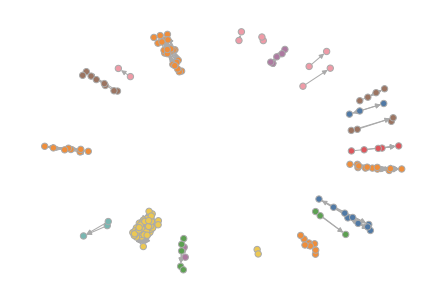

In [113]:
## visualize 
pos = networkx.spring_layout(graph)
plt.figure(3,figsize=(6,4)) 
networkx.draw(graph, pos, node_color = colors, node_size = 40, edge_color = '#aaa')
# networkx.draw_networkx_labels(graph, pos)

ax= plt.gca()
ax.collections[0].set_edgecolor("#aaa")

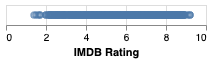

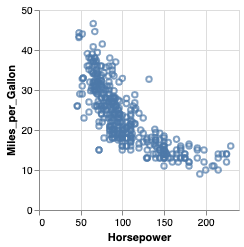

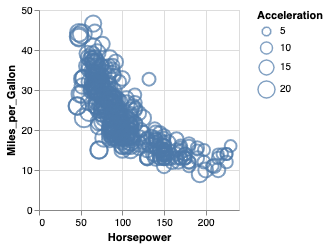

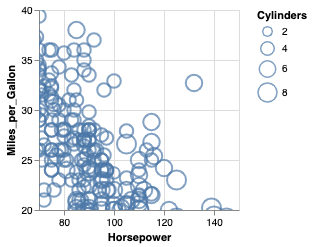

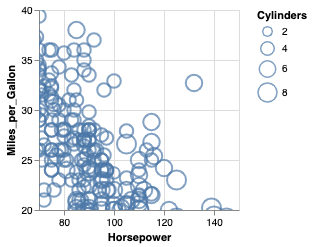

In [117]:
## visualize a path
path = networkx.algorithms.dag.dag_longest_path(graph)
for n in path[::-1]:
    V4Charts[n].show()